In [1]:
import torch
import torch.nn as nn
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from mpl_toolkits.axes_grid1 import make_axes_locatable
from IPython.display import Image

In [2]:
# === 1. Define the model architecture ===
class ConvPINN(nn.Module):
    def __init__(self, n_inputs, n_outputs):
        super().__init__()
        self.model = nn.Sequential(
            nn.Conv2d(n_inputs, 64, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.Conv2d(64, 64, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.Conv2d(64, n_outputs, kernel_size=3, padding=1)
        )

    def forward(self, forcing, prognostic, training=True, num_future_steps=1):
        if training:
            x = torch.cat([forcing, prognostic], dim=1)
            return self.model(x)
        else:
            predictions = []
            current = prognostic
            for t in range(num_future_steps):
                x = torch.cat([forcing[t:t+1], current], dim=1)
                current = self.model(x)
                predictions.append(current)
            return torch.cat(predictions, dim=0)

In [3]:
# === 2. Setup device and load trained model ===
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = ConvPINN(n_inputs=3, n_outputs=1).to(device)
model.load_state_dict(torch.load("pinn_trained_model.pt", map_location=device))
model.eval()

ConvPINN(
  (model): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU()
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU()
    (4): Conv2d(64, 1, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  )
)

In [4]:
# === 3. Load new Oceananigans output data ===
ds_new = xr.open_dataset("output-tracer-release-gaussian-wind_2025-06-18.nc")
u = ds_new['u'].squeeze('zC').rename({'xF': 'x', 'yC': 'y'})
v = ds_new['v'].squeeze('zC').rename({'xC': 'x', 'yF': 'y'})
c = ds_new['c'].squeeze('zC').rename({'xC': 'x', 'yC': 'y'})

ds_merge = xr.merge([
    u.to_dataset(name='u'),
    v.to_dataset(name='v'),
    c.to_dataset(name='c')
]).fillna(0.0)

ds_input = ds_merge.isel(time=slice(0, -1))
ds_target = ds_merge.isel(time=slice(1, None))

In [5]:
# === 4. Convert variables to tensors ===
def to_tensor(ds, var_list):
    arr = ds[var_list].to_array().values  # (vars, time, y, x)
    return torch.tensor(arr, dtype=torch.float32).permute(1, 0, 2, 3).to(device)

forcing_tensor = to_tensor(ds_input, ['u', 'v'])
prognostic_tensor = to_tensor(ds_input, ['c'])
target_tensor = to_tensor(ds_target, ['c'])

In [6]:
# === 5. Normalize using saved stats or recompute if retraining ===
f_mean = forcing_tensor.mean()
f_std = forcing_tensor.std()
p_mean = prognostic_tensor.mean()
p_std = prognostic_tensor.std()

forcing_tensor = (forcing_tensor - f_mean) / f_std
prognostic_tensor = (prognostic_tensor - p_mean) / p_std
target_tensor = (target_tensor - p_mean) / p_std

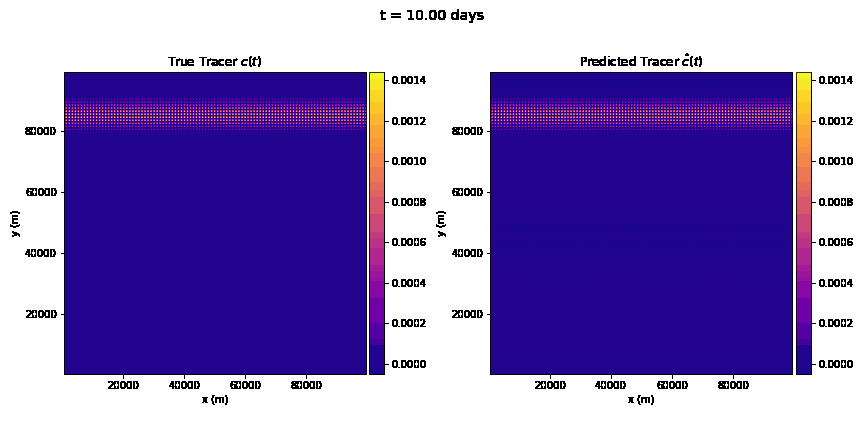

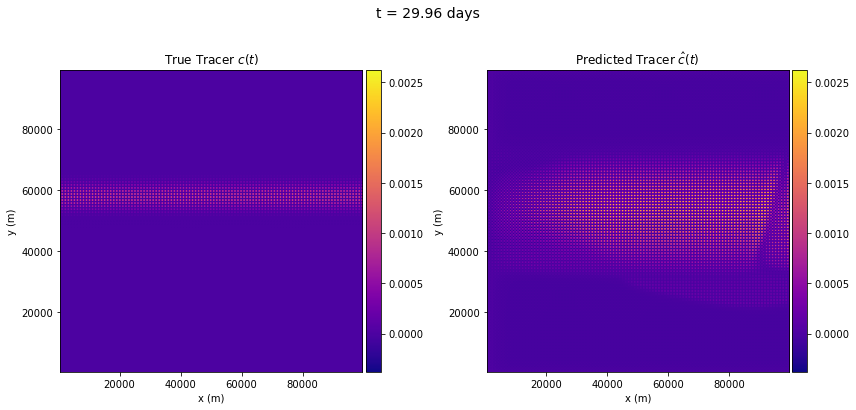

In [8]:
# === 6. Run ACE-style forward prediction ===
t_index = 240
n_future = 480

with torch.no_grad():
    f_seq = forcing_tensor[t_index:t_index + n_future]
    p0 = prognostic_tensor[t_index:t_index + 1]
    pred_seq = model(f_seq, p0, training=False, num_future_steps=n_future)

pred_seq = pred_seq * p_std + p_mean
true_seq = target_tensor[t_index:t_index + n_future] * p_std + p_mean

# === 7. Plot animation ===
x = ds_new["xC"].values
y = ds_new["yC"].values
time_seconds = ds_new["time"].values.astype("timedelta64[s]").astype(float)
time_days = time_seconds / (24 * 3600)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))
div1 = make_axes_locatable(ax1)
div2 = make_axes_locatable(ax2)
cax1 = div1.append_axes("right", size="5%", pad=0.05)
cax2 = div2.append_axes("right", size="5%", pad=0.05)

im1 = ax1.imshow(true_seq[0].squeeze().cpu(), origin="lower",
                 extent=[x.min(), x.max(), y.min(), y.max()],
                 cmap="plasma")
im2 = ax2.imshow(pred_seq[0].squeeze().cpu(), origin="lower",
                 extent=[x.min(), x.max(), y.min(), y.max()],
                 cmap="plasma")

fig.colorbar(im1, cax=cax1)
fig.colorbar(im2, cax=cax2)

ax1.set_title("True Tracer $c(t)$")
ax2.set_title("Predicted Tracer $\\hat{c}(t)$")
for ax in (ax1, ax2):
    ax.set_xlabel("x (m)")
    ax.set_ylabel("y (m)")

title = fig.suptitle(f"t = {time_days[t_index]:.2f} days", fontsize=14)

def update(frame):
    c_true = true_seq[frame].squeeze().cpu()
    c_pred = pred_seq[frame].squeeze().cpu()
    im1.set_array(c_true)
    im2.set_array(c_pred)
    cmin = min(c_true.min().item(), c_pred.min().item())
    cmax = max(c_true.max().item(), c_pred.max().item(), 1e-3)
    im1.set_clim(vmin=cmin, vmax=cmax)
    im2.set_clim(vmin=cmin, vmax=cmax)
    title.set_text(f"t = {time_days[t_index + frame]:.2f} days")
    return [im1, im2, title]

ani = FuncAnimation(fig, update, frames=n_future, interval=100, blit=False)
plt.tight_layout()
ani.save("pinn_inference_on_new_data.gif", writer="pillow", fps=10)
Image(filename="pinn_inference_on_new_data.gif")